# **Project Description**

## **Problem Definition**:
The objective of this project is to build an AI model for classifying dynamic human movements based on sensor data from wearable devices.

## **Overview**
The goal of this project is to preprocess the dataset, analyze the handcrafted and autocorrelation features, and build machine learning models for classification tasks. A detailed evaluation and comparison of model performance will be conducted using ROC curves.


### 1. **Data Analysis and  Preprocessing**
- **Comparison of Autocorrelation Mean Feature Values by Condition & Gender**
-  **Sensor Dimensions Statistical Measures Over Condition & Gender and Condition With 3D Visualization**

- **Gender Transformation**:  
  - Apply the square root (`sqrt`) transformation to the `Age` column to approximate a normal distribution.
- **Apply Pca for Dimensionality Reduction**
- **Feature Scaling**:  
  - Normalize or standardize features to ensure all variables are on a similar scale.
  - Technique to use:
    - Standard Scaling (z-score).

---

### 2. **Model Building**
Train and evaluate the following machine learning models:

1. **Logistic Regression (LR)**  
   - Simple and interpretable baseline model.  

2. **Support Vector Machine (SVM)**  
   - Effective for high-dimensional data.  

3. **Decision Tree (DT)**  
   - A simple tree-based model for understanding data splits.  

4. **Random Forest (RF)**  
   - Ensemble learning method that uses multiple decision trees for better performance.

5. **Gradient Boosting**  
   - Combines weak learners to form a strong learner.

6. **XGBoost**  
   - Advanced boosting algorithm optimized for speed and performance.

---

### 3. **Hyperparameter Tuning**
- Use grid search or random search to optimize hyperparameters for each model:
  - Example: `max_depth`, `learning_rate`, `n_estimators`, etc., for boosting methods.
  - Use cross-validation for better generalization.

---

### 4. **Evaluation and Comparison**
- Evaluate model performance using the following metrics:
  - Accuracy.
  - Precision.
  - Recall.
  - F1-score.
  - Area Under the ROC Curve (AUC-ROC).

- **ROC Curve Comparison**:
  - Plot and compare the ROC curves for all models to visualize and analyze their ability to differentiate between classes.

---

## **Outcome**
- Identify the best-performing model based on AUC-ROC and other evaluation metrics.
- Gain insights into the features and their importance in classification tasks.
- Provide a comprehensive comparison of models for future improvements.



# **Dataset Description**

## **Purpose of Data Collection**  
The dataset was collected to analyze and classify sensor signals under various experimental conditions. These signals were recorded using wearable or embedded sensors, capturing motion and other parameters. The primary aim is to leverage this data for activity recognition and condition classification tasks, ensuring robustness in identifying trends and patterns across diverse participant profiles.

---

## **Key Dataset Details**  

- **Participants**:  
  The data was collected from a diverse group of individuals across various age ranges and genders, ensuring broad demographic representation.  

- **Conditions**:  
  Each sample is labeled based on the conditions under which data was recorded (e.g., normal activity, anomaly, or task-specific scenarios).  

- **Sensors**:  
  - Data originates from **accelerometers** and **gyroscopes**, which monitor motion along the **X, Y, and Z axes**.  
  - Signals are captured continuously, providing rich temporal data for analysis.  

- **Recording Details**:  
  - Raw sensor readings span a fixed range of 0 to 299 values for each condition.
  - Signals are segmented into time-based windows for localized feature extraction.

---

## **Dataset Files**  
The dataset is organized into **three main files**, each serving a distinct role in the data analysis pipeline:

1. **Segment Data**:  
   - Contains raw or segmented sensor readings grouped by sessions or sequences.  
   - Includes key metadata such as session IDs (`ID`), age, gender, and condition.  
   - Serves as the foundation for raw data before preprocessing and feature extraction.  

2. **Feature Handcrafted Data**:  
   - Features are manually engineered to summarize the sensor readings.  
   - **Statistical Metrics**:  
     - **Amplitude-based**: Mean, median, max, min, variance.  
     - **Distribution-based**: Standard deviation, skewness, kurtosis.  
     - **Frequency-based** (if applicable): Root Mean Square (RMS), Spectral Entropy, etc.  
   - Columns include sensor features (`f_0` to `f_59`), along with gender, condition, and participant-level metadata.

3. **Feature Autocorrelation Data**:  
   - Captures **temporal dependencies** and **repetitive patterns** in the signals.  
   - Autocorrelation is computed for each signal axis over various time lags to assess self-similarity.  
   - Features are stored as numerical values for each lag, alongside gender and condition labels.

---



  

# Unzip File

In [114]:
!unzip /content/data-20250113T183600Z-001.zip

Archive:  /content/data-20250113T183600Z-001.zip
replace data/data_feature_handcrafted.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Libraries Needed

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import roc_curve, auc

from sklearn.model_selection import GridSearchCV


from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

import xgboost as xgb

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Import Data

In [2]:
data_feature_autocorrelation = pd.read_csv('/content/data/data_feature_autocorrelation.csv')
data_feature_handcrafted = pd.read_csv('/content/data/data_feature_handcrafted.csv')

# Data Exploration

In [3]:
data_feature_autocorrelation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1989 entries, 0 to 1988
Data columns (total 65 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         1989 non-null   float64
 1   condition  1989 non-null   float64
 2   num_seq    1989 non-null   float64
 3   age        1989 non-null   float64
 4   gender     1989 non-null   float64
 5   f_0        1989 non-null   float64
 6   f_1        1989 non-null   float64
 7   f_2        1989 non-null   float64
 8   f_3        1989 non-null   float64
 9   f_4        1989 non-null   float64
 10  f_5        1989 non-null   float64
 11  f_6        1989 non-null   float64
 12  f_7        1989 non-null   float64
 13  f_8        1989 non-null   float64
 14  f_9        1989 non-null   float64
 15  f_10       1989 non-null   float64
 16  f_11       1989 non-null   float64
 17  f_12       1989 non-null   float64
 18  f_13       1989 non-null   float64
 19  f_14       1989 non-null   float64
 20  f_15    

In [4]:
data_feature_handcrafted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1989 entries, 0 to 1988
Data columns (total 77 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         1989 non-null   float64
 1   condition  1989 non-null   float64
 2   num_seq    1989 non-null   float64
 3   age        1989 non-null   float64
 4   gender     1989 non-null   float64
 5   mean_gx    1989 non-null   float64
 6   mean_gy    1989 non-null   float64
 7   mean_gz    1989 non-null   float64
 8   mean_ax    1989 non-null   float64
 9   mean_ay    1989 non-null   float64
 10  mean_az    1989 non-null   float64
 11  median_gx  1989 non-null   float64
 12  median_gy  1989 non-null   float64
 13  median_gz  1989 non-null   float64
 14  median_ax  1989 non-null   float64
 15  median_ay  1989 non-null   float64
 16  median_az  1989 non-null   float64
 17  max_gx     1989 non-null   float64
 18  max_gy     1989 non-null   float64
 19  max_gz     1989 non-null   float64
 20  max_ax  

# Merge Datasets

In [5]:
data_feature_handcrafted.drop(columns = ['ID','condition','num_seq','age','gender'], inplace = True)
df = pd.concat([data_feature_autocorrelation, data_feature_handcrafted], axis=1)

In [6]:
df.shape

(1989, 137)

In [7]:
pd.set_option('display.max_columns', None)
df.sample(5)

,ID,condition,num_seq,age,gender,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,f_48,f_49,f_50,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59,mean_gx,mean_gy,mean_gz,mean_ax,mean_ay,mean_az,median_gx,median_gy,median_gz,median_ax,median_ay,median_az,max_gx,max_gy,max_gz,max_ax,max_ay,max_az,min_gx,min_gy,min_gz,min_ax,min_ay,min_az,mad_gx,mad_gy,mad_gz,mad_ax,mad_ay,mad_az,sem_gx,sem_gy,sem_gz,sem_ax,sem_ay,sem_az,skew_gx,skew_gy,skew_gz,skew_ax,skew_ay,skew_az,kurt_gx,kurt_gy,kurt_gz,kurt_ax,kurt_ay,kurt_az,std_gx,std_gy,std_gz,std_ax,std_ay,std_az,var_gx,var_gy,var_gz,var_ax,var_ay,var_az,rms_gx,rms_gy,rms_gz,rms_ax,rms_ay,rms_az,vs_gx,vs_gy,vs_gz,vs_ax,vs_ay,vs_az
1661,356863.0,1.0,1.0,38.0,0.0,0.744768,0.357054,0.223918,0.236253,0.156057,-0.014776,-0.138296,-0.181416,-0.211634,-0.255528,0.980037,0.934978,0.872518,0.798999,0.719450,0.636154,0.549851,0.461064,0.372290,0.287118,0.949063,0.859956,0.772929,0.694429,0.619542,0.545591,0.471679,0.395689,0.315831,0.229821,0.942293,0.798876,0.611930,0.403849,0.192729,0.005156,-0.141676,-0.247092,-0.314923,-0.350343,0.955693,0.870115,0.779919,0.697520,0.620654,0.544475,0.467182,0.384038,0.290257,0.182837,0.940916,0.821116,0.672656,0.505942,0.347798,0.204056,0.076241,-0.028417,-0.115270,-0.194857,-0.035414,0.061992,-0.026760,-0.039260,-0.995053,-0.047513,-0.003332,0.000757,-0.016640,-0.040,-0.996,-0.058,1.083240,1.52942,0.611866,0.372,-0.394,0.774,-1.084570,-1.22962,-0.964727,-0.562,-1.820,-0.536,0.260595,0.643591,0.347460,0.198669,0.403268,0.271316,0.016655,0.038751,0.017966,0.011189,0.018998,0.015062,-0.324376,0.246629,-0.258457,-0.025326,-0.178150,0.663672,1.254447,-0.679141,-0.379823,-0.391639,-0.886629,0.122679,0.288000,0.670068,0.310660,0.193476,0.328508,0.260442,0.082944,0.448992,0.096510,0.037433,0.107918,0.067830,0.290169,0.672930,0.311810,0.197419,1.047878,0.264740,-10.624187,18.597696,-8.028122,-11.778,-298.516,-14.254
1502,314225.0,1.0,1.0,17.0,1.0,0.892798,0.712594,0.530760,0.373104,0.243290,0.153643,0.090462,0.048774,0.017402,-0.013558,0.964816,0.879957,0.767549,0.646629,0.531530,0.434171,0.363078,0.320251,0.303106,0.304739,0.962481,0.877473,0.766181,0.646309,0.530817,0.424540,0.328641,0.240488,0.155554,0.071491,0.890501,0.644179,0.326742,0.014042,-0.238081,-0.396755,-0.448610,-0.400592,-0.279972,-0.126700,0.963843,0.888985,0.796358,0.699158,0.609276,0.534230,0.476384,0.434422,0.400957,0.366216,0.948272,0.837083,0.701105,0.562571,0.435210,0.327320,0.239050,0.167733,0.112533,0.071656,-0.017677,-0.101508,-0.027790,0.028573,-0.975953,0.000927,0.017974,-0.175012,-0.053925,-0.004,-0.969,0.025,1.248350,1.68921,0.942098,0.902,-0.460,0.686,-1.025980,-1.05385,-0.879507,-0.592,-1.712,-0.600,0.189523,0.615953,0.307977,0.145295,0.455159,0.200151,0.018162,0.030608,0.017275,0.012921,0.019390,0.014178,-0.152865,0.486406,0.222285,0.889267,-0.263545,-0.059198,2.078670,0.010337,0.279009,2.575135,-1.212623,0.088970,0.314043,0.529261,0.298707,0.223419,0.335276,0.245156,0.098623,0.280118,0.089226,0.049916,0.112410,0.060102,0.314540,0.538908,0.299997,0.225238,1.031938,0.245158,-5.303144,-30.452497,-8.337051,8.572,-292.786,0.278
1143,139970.0,1.0,1.0,26.0,1.0,0.936121,0.834256,0.753255,0.674450,0.599261,0.540484,0.482202,0.405840,0.315877,0.227604,0.916956,0.748112,0.576256,0.429217,0.306600,0.209959,0.135211,0.073820,0.024549,-0.007313,0.913945,0.721781,0.508924,0.341670,0.245343,0.211925,0.210167,0.204644,0.176100,0.121239,0.921207,0.736967,0.503089,0.270746,0.078054,-0.056890,-0.127144,-0.142862,-0.120474,-0.077467,0.937431,0.799010,0.639015,0.486551,0.366847,0.289420,0.242174,0.206991,0.169620,0.119593,0.854042,0.648564,0.516344,0.352981,0.169048,0.036794,-0.047616,-0.113535,-0.164002,-0.198932,-0.013394,-0.007878,0.012803,0.065633,-1.024580,-0.144987,0.005781,-0.051004,0.040020,0.066,-0.918,-0.154,0.740813,1.01

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1989 entries, 0 to 1988
Columns: 137 entries, ID to vs_az
dtypes: float64(137)
memory usage: 2.1 MB


# Bias Data
## Note: The following cells untill see the real data are for simulate bias problem only

In [9]:
print(df['condition'].value_counts())
print(df['gender'].value_counts())

condition
1.0    1104
0.0     885
Name: count, dtype: int64
gender
1.0    1038
0.0     951
Name: count, dtype: int64


In [11]:
condition_1 = df[df['condition'] == 0]
condition_2 = df[df['condition'] == 1]

males = df[df['gender'] == 0]
females = df[df['gender'] == 1]

In [12]:
from sklearn.utils import resample

condition_1_under = resample(condition_1,
                             replace=False,
                             n_samples=int(len(df) * 0.003),
                             random_state=42)

gender_male_under = resample(males,
                             replace=False,
                             n_samples=int(len(df) * 0.001),
                             random_state=42)

biased_data = pd.concat([condition_1_under, condition_2, gender_male_under, females])

In [13]:
biased_data = pd.concat([condition_1_under, condition_2, females, gender_male_under])
print(biased_data['condition'].value_counts())
print(biased_data['gender'].value_counts())


print(df['condition'].value_counts())
print(df['gender'].value_counts())

condition
1.0    1676
0.0     472
Name: count, dtype: int64
gender
1.0    1614
0.0     534
Name: count, dtype: int64
condition
1.0    1104
0.0     885
Name: count, dtype: int64
gender
1.0    1038
0.0     951
Name: count, dtype: int64


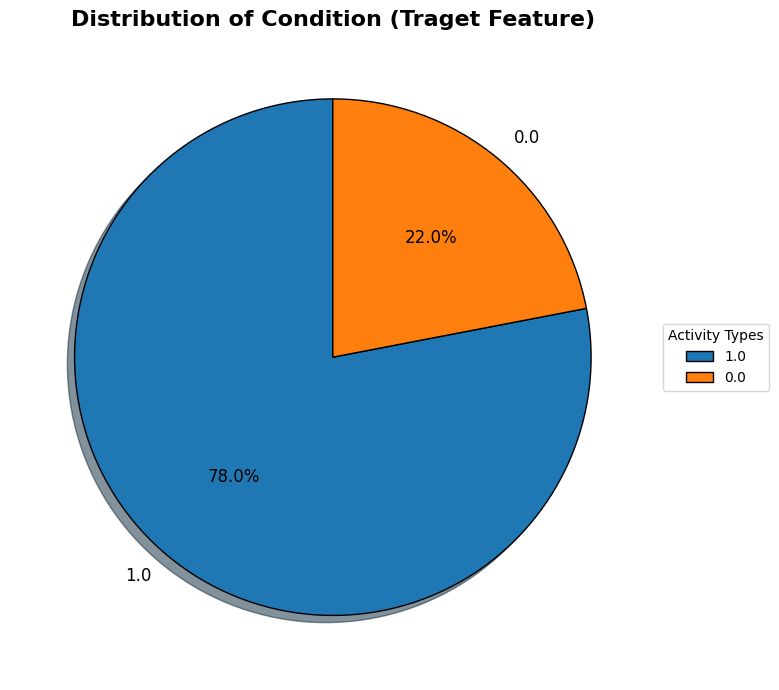

In [14]:
target_dist = biased_data['condition'].value_counts()

plt.figure(figsize = (10,7))
plt.pie(target_dist, labels = target_dist.index, autopct = '%1.1f%%',
         shadow=True,
    startangle=90,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 12},)
plt.title('Distribution of Condition (Traget Feature)', fontsize=16, fontweight='bold')
plt.legend(target_dist.index, title="Activity Types", loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

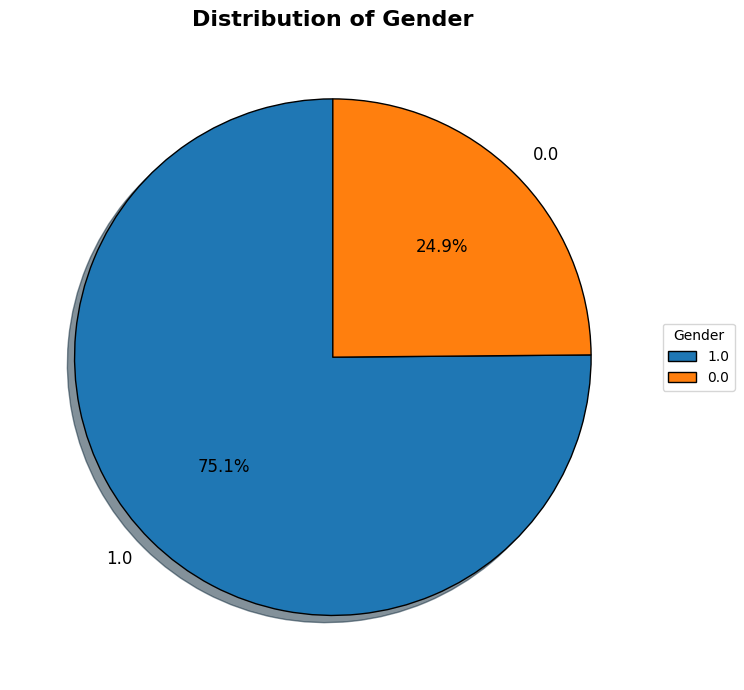

In [15]:
gender_dist = biased_data['gender'].value_counts()

plt.figure(figsize = (10,7))
plt.pie(gender_dist, labels = gender_dist.index, autopct = '%1.1f%%',
         shadow=True,
    startangle=90,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 12},)
plt.title('Distribution of Gender', fontsize=16, fontweight='bold')
plt.legend(gender_dist.index, title="Gender", loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [ ]:
############################################################################################

# Real Data

# Explore Autocorrelation

In [18]:
pd.set_option('display.max_columns', None)

gender_autocorrelation_mean = df[['gender'] + [f'f_{i}' for i in range(60)]].groupby('gender').mean()
gender_autocorrelation_mean

,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,f_48,f_49,f_50,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59
gender,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.830009,0.532211,0.324757,0.222894,0.165361,0.118021,0.080036,0.054723,0.035791,0.017616,0.965002,0.887826,0.791132,0.687420,0.582920,0.481930,0.388029,0.304086,0.231789,0.171535,0.952170,0.843564,0.710624,0.580238,0.463067,0.358329,0.261133,0.167639,0.076844,-0.009936,0.911118,0.704999,0.455096,0.213805,0.010293,-0.143492,-0.246106,-0.302913,-0.322928,-0.315757,0.916756,0.743497,0.560388,0.405534,0.296082,0.233144,0.203354,0.185742,0.161562,0.122027,0.913927,0.754813,0.602921,0.475929,0.368988,0.269593,0.171568,0.078210,-0.005964,-0.077457
1.0,0.866722,0.625605,0.431172,0.303180,0.220147,0.170800,0.143418,0.122755,0.100139,0.074956,0.963703,0.884115,0.785029,0.680851,0.579922,0.487854,0.407842,0.340902,0.286614,0.243614,0.955168,0.852033,0.721039,0.587182,0.463279,0.352468,0.252016,0.157453,0.065458,-0.024697,0.890050,0.634504,0.332761,0.057814,-0.148665,-0.270270,-0.312390,-0.296142,-0.247369,-0.187517,0.921212,0.750474,0.561385,0.396121,0.277140,0.208976,0.178731,0.165659,0.151755,0.126085,0.914666,0.748163,0.582546,0.447084,0.346162,0.270335,0.206221,0.144174,0.081481,0.020317


In [19]:
fig = px.line(gender_autocorrelation_mean.T,
              labels={'value': 'Mean Value', 'index': 'Feature'},
              title='Comparison of Autocorrelation Mean Feature Values by Gender')

fig.update_layout(
    xaxis_title='Feature (f_0 to f_59)',
    yaxis_title='Mean Value',
    legend_title='Gender',
    xaxis=dict(tickmode='array', tickvals=list(range(60)), ticktext=[f'f_{i}' for i in range(60)])
)

fig.show()

In [20]:
pd.set_option('display.max_columns', None)
condition_autocorrelation_mean = df[['condition'] + [f'f_{i}' for i in range(60)]].groupby('condition').mean()
condition_autocorrelation_mean

,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,f_48,f_49,f_50,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59
condition,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.860677,0.607002,0.406157,0.285502,0.213449,0.165502,0.132508,0.108424,0.086222,0.061916,0.964393,0.885232,0.785347,0.679026,0.574538,0.477321,0.390759,0.316591,0.255147,0.205593,0.953905,0.849463,0.718683,0.587122,0.466567,0.358503,0.259471,0.165492,0.074213,-0.014491,0.900371,0.668847,0.389634,0.126987,-0.081137,-0.218551,-0.286734,-0.300010,-0.277764,-0.237368,0.920731,0.750048,0.562990,0.401917,0.287380,0.222090,0.193128,0.180055,0.164065,0.134168,0.918557,0.762247,0.603717,0.467512,0.357287,0.265903,0.184121,0.108647,0.039703,-0.021532
1.0,0.839942,0.560067,0.359557,0.248192,0.178323,0.129583,0.097565,0.075639,0.055865,0.036016,0.964269,0.886417,0.790031,0.687973,0.586820,0.491195,0.404470,0.328676,0.264613,0.212003,0.953598,0.846798,0.713956,0.581249,0.460460,0.352678,0.253894,0.159783,0.068248,-0.020163,0.899925,0.667699,0.392551,0.136735,-0.065868,-0.202521,-0.275859,-0.298874,-0.288091,-0.258023,0.917760,0.744805,0.559239,0.399583,0.285248,0.219282,0.188400,0.171418,0.150335,0.116110,0.910910,0.742601,0.583126,0.455555,0.356907,0.273248,0.194087,0.115831,0.039646,-0.030360


In [21]:
fig = px.line(condition_autocorrelation_mean.T,
              labels={'value': 'Mean Value', 'index': 'Feature'},
              title='Comparison of Autocorrelation Mean Feature Values by Condition')

fig.update_layout(
    xaxis_title='Feature (f_0 to f_59)',
    yaxis_title='Mean Value',
    legend_title='Condition',
    xaxis=dict(tickmode='array', tickvals=list(range(60)), ticktext=[f'f_{i}' for i in range(60)])
)

fig.show()

In [22]:
df.columns

Index(['ID', 'condition', 'num_seq', 'age', 'gender', 'f_0', 'f_1', 'f_2',
       'f_3', 'f_4',
       ...
       'rms_gz', 'rms_ax', 'rms_ay', 'rms_az', 'vs_gx', 'vs_gy', 'vs_gz',
       'vs_ax', 'vs_ay', 'vs_az'],
      dtype='object', length=137)

# Explore Statistical Measures Features

In [23]:
df.drop(columns = ['ID','num_seq'],inplace = True)

In [24]:
df.shape

(1989, 135)

In [28]:
columns = df.columns

# Features Scaling

In [25]:
X = df.drop(columns=['condition','gender'])
y = df['condition']

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

df_scaled = pd.concat([X_scaled_df, y], axis=1)
df_scaled = pd.concat([df_scaled, df['gender']], axis=1)
df = df_scaled

In [29]:
df.describe()

,age,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,f_48,f_49,f_50,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59,mean_gx,mean_gy,mean_gz,mean_ax,mean_ay,mean_az,median_gx,median_gy,median_gz,median_ax,median_ay,median_az,max_gx,max_gy,max_gz,max_ax,max_ay,max_az,min_gx,min_gy,min_gz,min_ax,min_ay,min_az,mad_gx,mad_gy,mad_gz,mad_ax,mad_ay,mad_az,sem_gx,sem_gy,sem_gz,sem_ax,sem_ay,sem_az,skew_gx,skew_gy,skew_gz,skew_ax,skew_ay,skew_az,kurt_gx,kurt_gy,kurt_gz,kurt_ax,kurt_ay,kurt_az,std_gx,std_gy,std_gz,std_ax,std_ay,std_az,var_gx,var_gy,var_gz,var_ax,var_ay,var_az,rms_gx,rms_gy,rms_gz,rms_ax,rms_ay,rms_az,vs_gx,vs_gy,vs_gz,vs_ax,vs_ay,vs_az,condition,gender
count,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1989.000000,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1989.000000,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1989.000000,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1.989000e+03,1989.000000,1989.000000
mean,7.501960e-17,4.572623e-16,-4.001045e-16,1.214603e-16,1.357497e-16,5.715779e-17,-6.430251e-17,-2.857889e-17,-2.143417e-17,-3.572362e-17,0.000000,1.428052e-15,1.716520e-15,-3.036507e-17,-1.143156e-16,-3.572362e-18,3.215126e-17,-1.214603e-16,-1.607563e-16,1.964799e-16,-2.679271e-18,1.786181e-18,1.427158e-15,2.000523e-16,4.108216e-16,-1.875490e-16,3.572362e-18,1.393221e-16,5.894397e-17,1.607563e-17,-3.572362e-18,-6.519560e-16,-1.169948e-16,-1.250327e-16,-3.750980e-17,-2.679271e-17,3.929598e-17,-2.214864e-16,-2.058573e-16,-2.107693e-16,-7.501960e-17,3.858151e-16,1.836194e-15,2.179141e-16,-3.750980e-17,3.072231e-16,3.215126e-17,4.108216e-17,8.395050e-17,-4.644070e-17,-1.286050e-16,1.821904e-15,2.643548e-16,-5.715779e-17,1.714734e-16,-1.321774e-16,2.875751e-16,-7.501960e-17,3.929598e-17,-6.653524e-17,-2.143417e-17,7.144723e-17,-2.143417e-17,-7.144723e-18,0.000000,3.959963e-15,-1.428945e-17,1.428945e-17,8.930904e-18,-3.215126e-17,-2.143417e-17,-2.572100e-16,7.144723e-18,1.714734e-16,-2.429206e-16,-2.786442e-16,-1.143156e-16,-3.572362e-17,1.286050e-16,2.500653e-16,3.429467e-16,8.573668e-17,1.286050e-16,-1.214603e-16,6.698178e-17,-2.714995e-16,1.929075e-16,5.001306e-17,-2.929337e-16,-2.500653e-16,1.714734e-16,-7.859196e-17,2.500653e-16,-1.714734e-16,0.000000,3.786703e-16,5.715779e-17,2.857889e-17,-1.875490e-17,1.607563e-17,-1.250327e-17,2.500653e-17,3.215126e-17,3.572362e-17,-3.30

In [30]:
df.sample(5)

,age,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,f_48,f_49,f_50,f_51,f_52,f_53,f_54,f_55,f_56,f_57,f_58,f_59,mean_gx,mean_gy,mean_gz,mean_ax,mean_ay,mean_az,median_gx,median_gy,median_gz,median_ax,median_ay,median_az,max_gx,max_gy,max_gz,max_ax,max_ay,max_az,min_gx,min_gy,min_gz,min_ax,min_ay,min_az,mad_gx,mad_gy,mad_gz,mad_ax,mad_ay,mad_az,sem_gx,sem_gy,sem_gz,sem_ax,sem_ay,sem_az,skew_gx,skew_gy,skew_gz,skew_ax,skew_ay,skew_az,kurt_gx,kurt_gy,kurt_gz,kurt_ax,kurt_ay,kurt_az,std_gx,std_gy,std_gz,std_ax,std_ay,std_az,var_gx,var_gy,var_gz,var_ax,var_ay,var_az,rms_gx,rms_gy,rms_gz,rms_ax,rms_ay,rms_az,vs_gx,vs_gy,vs_gz,vs_ax,vs_ay,vs_az,condition,gender
1231,-1.171395,0.782744,0.933144,1.014735,1.031386,1.073383,1.157967,1.212593,1.083414,0.780664,0.424703,-0.084746,-0.358268,-0.593313,-0.825754,-1.047147,-1.250062,-1.424304,-1.560645,-1.667559,-1.755803,0.763096,0.535385,0.337902,0.080662,-0.236886,-0.561802,-0.792192,-0.842765,-0.709531,-0.451639,0.552711,0.523563,0.456816,0.355414,0.224510,-0.010654,-0.426633,-0.888743,-1.109399,-1.102898,1.051757,1.202111,1.190905,1.120637,0.980624,0.717171,0.382531,0.095121,-0.059799,-0.080036,0.534464,0.582556,0.654966,0.603127,0.275715,-0.291195,-0.859423,-1.139386,-1.117513,-0.988407,1.039408,1.926452,2.927970,-0.763731,1.998458,0.277824,1.417393,0.732783,2.002414,0.009668,2.634797,0.214934,-0.503942,1.750759,3.384488,2.120313,0.528736,0.388255,-0.478180,-2.573857,-3.204498,-4.242274,-1.071455,-0.266421,0.381654,-0.176587,1.251337,2.363788,-0.055913,-0.241527,0.260121,0.832668,2.707889,4.000988,1.159868,0.920421,-0.766056,-1.505637,-0.330558,-1.018319,-1.257923,0.529803,-0.558673,5.494134,1.383342,0.643158,0.767922,0.071622,0.260121,0.832668,2.707889,4.000988,1.159868,0.920421,0.054333,0.614080,3.100381,5.405180,1.057599,0.794234,0.251349,0.838867,2.715533,3.873469,-0.254058,0.504990,1.039408,1.926452,2.927970,-0.763731,1.998458,0.277824,1.0,0.0
345,0.383564,0.534494,0.452767,0.289563,-0.034414,-0.463957,-0.968114,-1.554435,-2.209345,-2.907361,-3.607795,-1.736537,-1.115591,-0.539042,-0.200837,-0.055743,-0.009275,-0.006730,-0.020170,-0.035752,-0.072203,0.142382,-0.058730,-0.249589,-0.476387,-0.737822,-0.992157,-1.178229,-1.246903,-1.207286,-1.087853,0.889303,1.211044,1.454418,1.607891,1.713737,1.748909,1.539693,0.899094,0.108133,-0.535458,-0.804873,-0.512691,-0.114919,0.002657,-0.139522,-0.346346,-0.503252,-0.625823,-0.774867,-1.002991,0.670578,0.768655,0.805015,0.559775,-0.008353,-0.808860,-1.617193,-2.241670,-2.690203,-3.018050,-0.286619,-0.538764,-1.213714,-1.649224,0.974137,-1.268297,-6.841231,2.283642,-1.091339,-2.043997,0.699702,-1.380192,5.349584,0.211650,1.884791,-0.201461,4.159325,0.761790,-3.664681,-1.858910,-1.569773,-0.063731,0.260156,-2.808792,5.101455,1.047117,0.852168,1.426753,1.546839,2.225550,7.155953,1.519811,1.356609,0.638098,1.095634,2.541562,2.019032,-2.041837,0.083793,0.559608,1.495998,-0.488800,0.640078,-0.278392,0.658424,-1.029843,-0.833867,-0.201483,7.155953,1.519811,1.356609,0.638098,1.095634,2.541562,11.862498,1.414088,1.212496,0.459470,0.984134,2.858366,7.153261,1.515391,1.356996,0.710826,0.275585,1.643502,-0.286619,-0.538764,-1.213714,-1.649224,0.974137,-1.268297,0.0,0.0
1819,-0.249938,0.192231,0.345593,0.491803,0.464632,0.224845,-0.054802,-0.341632,-0.721206,-1.158258,-1.300578,-0.013461,-0.180393,-0.397290,-0.630805,-0.859507,-1.066880,-1.230802,-1.326196,-1.342012,-1.275566,0.967233,0.906702,0.873486,0.826109,0.722571,0.552340,0.354401,0.182594,0.067382,-0.002088,0.719757,0.674227,0.493200,0.222878,-0.154051,-0.693696,-1.390711,-1.902453,-1.919240,-1.685599,0.024952,0.359743,0.531699,0.408180,0.105654,-0.226294,-0.490777,-0.692876,-0.872811,-0.899698,1.254432,1.695129,2.010603,2.307667,2.599606,2.746612,2.758666,2.692723,2.557109,2.418848,-0.109804,0.765311,1.590101,-0.48533

# Age Distribution

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning:

invalid value encountered in sqrt



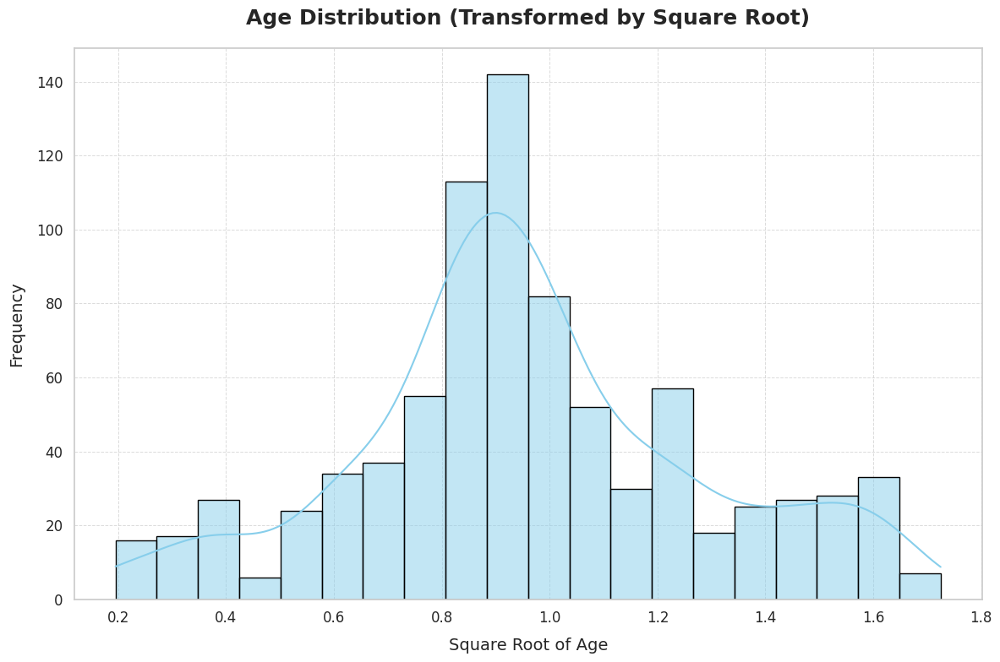

In [26]:
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
sns.histplot(
    np.sqrt(df['age']),
    kde=True,
    color='skyblue',
    edgecolor='black',
)


plt.title('Age Distribution (Transformed by Square Root)', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Square Root of Age', fontsize=14, labelpad=10)
plt.ylabel('Frequency', fontsize=14, labelpad=10)


plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='major', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()

plt.show()

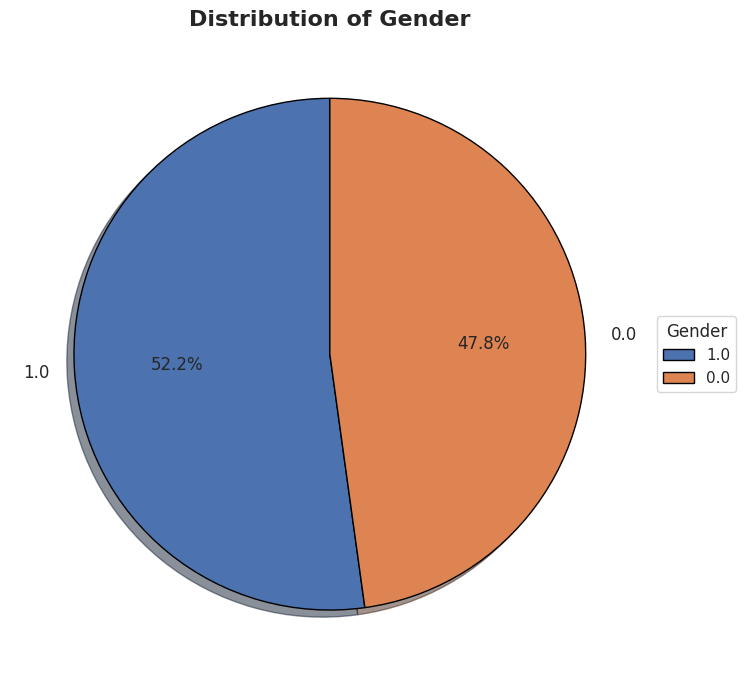

In [31]:
gender_dist = df['gender'].value_counts()

plt.figure(figsize = (10,7))
plt.pie(gender_dist, labels = gender_dist.index, autopct = '%1.1f%%',
         shadow=True,
    startangle=90,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 12},)
plt.title('Distribution of Gender', fontsize=16, fontweight='bold')
plt.legend(gender_dist.index, title="Gender", loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

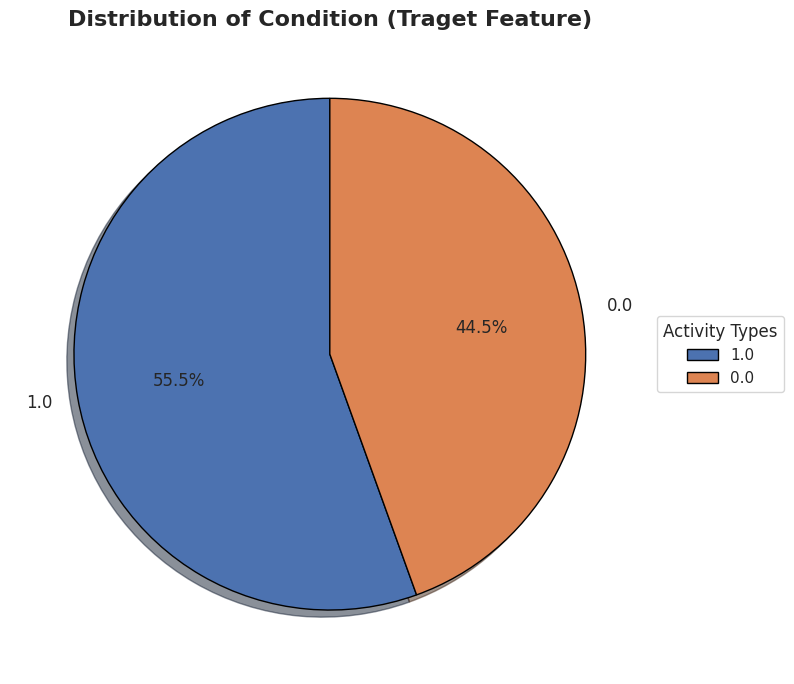

In [32]:
target_dist = df['condition'].value_counts()

plt.figure(figsize = (10,7))
plt.pie(target_dist, labels = target_dist.index, autopct = '%1.1f%%',
         shadow=True,
    startangle=90,
    wedgeprops={'edgecolor': 'black'},
    textprops={'fontsize': 12},)
plt.title('Distribution of Condition (Traget Feature)', fontsize=16, fontweight='bold')
plt.legend(target_dist.index, title="Activity Types", loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [33]:
df.columns

Index(['age', 'f_0', 'f_1', 'f_2', 'f_3', 'f_4', 'f_5', 'f_6', 'f_7', 'f_8',
       ...
       'rms_ay', 'rms_az', 'vs_gx', 'vs_gy', 'vs_gz', 'vs_ax', 'vs_ay',
       'vs_az', 'condition', 'gender'],
      dtype='object', length=135)

In [34]:
columns_to_visualize = [
    'mean_gx', 'mean_gy', 'mean_gz', 'mean_ax', 'mean_ay', 'mean_az',
    'median_gx', 'median_gy', 'median_gz', 'median_ax', 'median_ay', 'median_az',
    'max_gx', 'max_gy', 'max_gz', 'max_ax', 'max_ay', 'max_az',
    'min_gx', 'min_gy', 'min_gz', 'min_ax', 'min_ay', 'min_az', 'mad_gx',
    'mad_gy', 'mad_gz', 'mad_ax', 'mad_ay', 'mad_az', 'sem_gx', 'sem_gy',
    'sem_gz', 'sem_ax', 'sem_ay', 'sem_az', 'skew_gx', 'skew_gy', 'skew_gz',
    'skew_ax', 'skew_ay', 'skew_az', 'kurt_gx', 'kurt_gy', 'kurt_gz',
    'kurt_ax', 'kurt_ay', 'kurt_az', 'std_gx', 'std_gy', 'std_gz', 'std_ax',
    'std_ay', 'std_az', 'var_gx', 'var_gy', 'var_gz', 'var_ax', 'var_ay',
    'var_az', 'rms_gx', 'rms_gy', 'rms_gz', 'rms_ax', 'rms_ay', 'rms_az',
    'vs_gx', 'vs_gy', 'vs_gz', 'vs_ax', 'vs_ay', 'vs_az'
]

#  Sensor Dimensions Statistical Measures Over Gender and Condition With 3D Visualization

In [35]:
for i in range(0, len(columns_to_visualize)-2, 3):
    x = columns_to_visualize[i]
    y = columns_to_visualize[i+1]
    z = columns_to_visualize[i+2]

    fig = px.scatter_3d(df,
                        x=x,
                        y=y,
                        z=z,
                        color='gender',
                        labels={'gender': 'Gender'},
                        title=f"3D Scatter Plot of {x}, {y}, {z}")

    fig.show()


In [36]:
for i in range(0, len(columns_to_visualize)-2, 3):
    x = columns_to_visualize[i]
    y = columns_to_visualize[i+1]
    z = columns_to_visualize[i+2]

    fig = px.scatter_3d(df,
                        x=x,
                        y=y,
                        z=z,
                        color='condition',
                        labels={'condition': 'Condition'},
                        title=f"3D Scatter Plot of {x}, {y}, {z}")

    fig.show()

#  Sensor Dimensions Statistical Measures Distribution Over Gender and Condition With Box Plot

In [37]:
for feature in columns_to_visualize:
    fig = px.box(df,
                 x='gender',
                 y=feature,
                 color='gender',
                 title=f'Distribution of {feature} by Gender',
                 labels={'gender': 'Gender', feature: f'{feature} Value'})
    fig.show()

In [38]:
for feature in columns_to_visualize:
    fig = px.box(df,
                 x='condition',
                 y=feature,
                 color='condition',
                 title=f'Distribution of {feature} by Condition',
                 labels={'condition': 'Condition', feature: f'{feature} Value'})
    fig.show()


# Optional

# Apply PCA

In [39]:
# X = df.drop(columns=['condition']) # Features
# y = df['condition']

# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# pca = PCA(n_components=50)
# X_pca = pca.fit_transform(X_scaled)

# print("Explained variance ratio:", pca.explained_variance_ratio_)
# X_pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1]) ])
# X = X_pca_df

# Split Data

In [40]:
target = 'condition'

X = df.drop(columns=[target])
y = df[target]

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape

((1591, 134), (398, 134))

# Model Building

# Logistic Regression Model

In [42]:
lr = LogisticRegression(max_iter = 10000)
lr.fit(X_train,y_train)

y_pred_test = lr.predict(X_test)
y_pred_train = lr.predict(X_train)
print(accuracy_score(y_train,y_pred_train))
print(accuracy_score(y_test,y_pred_test))

0.6920175989943432
0.6658291457286433


In [43]:
lr = LogisticRegression(max_iter=10000)

param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga'],
}

grid_search = GridSearchCV(estimator=lr, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1)
grid_search.fit(X_train, y_train)

print("Best Parameters: ", grid_search.best_params_)
print("Best Training Score: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy}")

Fitting 5 folds for each of 32 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


80 fits failed out of a total of 160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/

Best Parameters:  {'C': 10, 'penalty': 'l2', 'solver': 'saga'}
Best Training Score:  0.6411111768301098
Test Accuracy: 0.6608040201005025


# SVM Model

In [44]:
svm_model = SVC()
svm_model.fit(X_train, y_train)

print(svm_model.score(X_train, y_train))
print(svm_model.score(X_test, y_test))

0.8145820238843494
0.6557788944723618


In [45]:
svm_model = SVC()

param_grid = {
    'C': [0.01, 0.1, 1, 10],
    'kernel': ['poly', 'rbf', 'sigmoid'],
}

grid_search = GridSearchCV(svm_model, param_grid, refit=True, verbose=2)
grid_search.fit(X_train, y_train)
print(f"Best parameters: {grid_search.best_params_}")
print("Best Training Score: ", grid_search.best_score_)


y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f" Test Accuracy: {accuracy}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ................................C=0.01, kernel=poly; total time=   0.2s
[CV] END ................................C=0.01, kernel=poly; total time=   0.2s
[CV] END ................................C=0.01, kernel=poly; total time=   0.2s
[CV] END ................................C=0.01, kernel=poly; total time=   0.2s
[CV] END ................................C=0.01, kernel=poly; total time=   0.2s
[CV] END .................................C=0.01, kernel=rbf; total time=   0.2s
[CV] END .................................C=0.01, kernel=rbf; total time=   0.2s
[CV] END .................................C=0.01, kernel=rbf; total time=   0.2s
[CV] END .................................C=0.01, kernel=rbf; total time=   0.2s
[CV] END .................................C=0.01, kernel=rbf; total time=   0.2s
[CV] END .............................C=0.01, kernel=sigmoid; total time=   0.3s
[CV] END .............................C=0.01, ke

# DecisionTree Model

In [46]:
dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)

y_pred_test = dt.predict(X_test)
y_pred_train = dt.predict(X_train)

print(accuracy_score(y_train,y_pred_train))
print(accuracy_score(y_test,y_pred_test))

1.0
0.6055276381909548


In [47]:
dt = DecisionTreeClassifier()

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [20, 30,40,50,70, 100],
}


grid_search = GridSearchCV(estimator=dt, param_grid=param_grid,scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters: ", grid_search.best_params_)
print("Best Training Score: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy}")

Best Parameters:  {'criterion': 'gini', 'max_depth': 40}
Best Training Score:  0.5895763096153466
Test Accuracy: 0.5829145728643216


# Random Forest Model

In [48]:
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred_test = rf.predict(X_test)
y_pred_train = rf.predict(X_train)
print(accuracy_score(y_train,y_pred_train))
print(accuracy_score(y_test,y_pred_test))

1.0
0.6934673366834171


In [49]:
rf = RandomForestClassifier()

param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [10, 20, 30, 40, 50,60],
    'criterion': ['gini', 'entropy'],
}


grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters: ", grid_search.best_params_)
print("Best Training Score: ", grid_search.best_score_)

y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy}")

Best Parameters:  {'criterion': 'entropy', 'max_depth': 60, 'n_estimators': 100}
Best Training Score:  0.6668993119220834
Test Accuracy: 0.6884422110552764


# Gradient Boosting Model

In [50]:
gb = GradientBoostingClassifier()
gb.fit(X_train,y_train)
y_pred_test = gb.predict(X_test)
y_pred_train = gb.predict(X_train)
print(accuracy_score(y_train,y_pred_train))
print(accuracy_score(y_test,y_pred_test))

0.8969201759899434
0.635678391959799


In [51]:
gb = GradientBoostingClassifier()

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 7],

}

grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters: ", grid_search.best_params_)
print("Best Training Score: ", grid_search.best_score_)
y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy}")

Best Parameters:  {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
Best Training Score:  0.6492833343191183
Test Accuracy: 0.6532663316582915


# XGBoost Model

In [52]:
xg = xgb.XGBClassifier(learning_rate= 0.1, max_depth=7, n_estimators=200)
xg.fit(X_train,y_train)
y_pred_test = xg.predict(X_test)
y_pred_train = xg.predict(X_train)
print(accuracy_score(y_train,y_pred_train))
print(accuracy_score(y_test,y_pred_test))

1.0
0.6683417085427136


# Models Performance and Comparison

In [55]:
lr_model = LogisticRegression(max_iter=10000)
svm_model = SVC(C = 10, kernel = 'rbf',probability=True)
dt_model  = DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=1, min_samples_split=5)
rf_model = RandomForestClassifier(criterion = 'gini', max_depth = 40, n_estimators = 150)
gb_model = GradientBoostingClassifier(learning_rate=0.1, max_depth=7, n_estimators=200)
xg_model = xgb.XGBClassifier(learning_rate= 0.1, max_depth=7, n_estimators=200)


In [64]:
!pip install scikit-learn

In [57]:
lr_model.fit(X_train, y_train)
svm_model.fit(X_train, y_train)
dt_model.fit(X_train, y_train)
rf_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
# xg_model.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=7, n_estimators=200)

In [66]:
acc_test_lr = lr_model.score(X_test, y_test)
acc_test_svm = svm_model.score(X_test, y_test)
acc_test_dt = dt_model.score(X_test, y_test)
acc_test_rf = rf_model.score(X_test, y_test)
acc_test_gb = gb_model.score(X_test, y_test)
acc_test_xg = xg.score(X_test, y_test)

In [72]:
print(f"Logistic Regression Test Accuracy: {acc_test_lr}")
print(f"SVM Test Accuracy: {acc_test_svm}")
print(f"Decision Tree Test Accuracy: {acc_test_dt}")
print(f"Random Forest Test Accuracy: {acc_test_rf}")
print(f"Gradient Boosting Test Accuracy: {acc_test_gb}")
print(f"XGBoost Test Accuracy: {acc_test_xg}")

Logistic Regression Test Accuracy: 0.6658291457286433
SVM Test Accuracy: 0.7236180904522613
Decision Tree Test Accuracy: 0.5829145728643216
Random Forest Test Accuracy: 0.6633165829145728
Gradient Boosting Test Accuracy: 0.6758793969849246
XGBoost Test Accuracy: 0.6683417085427136


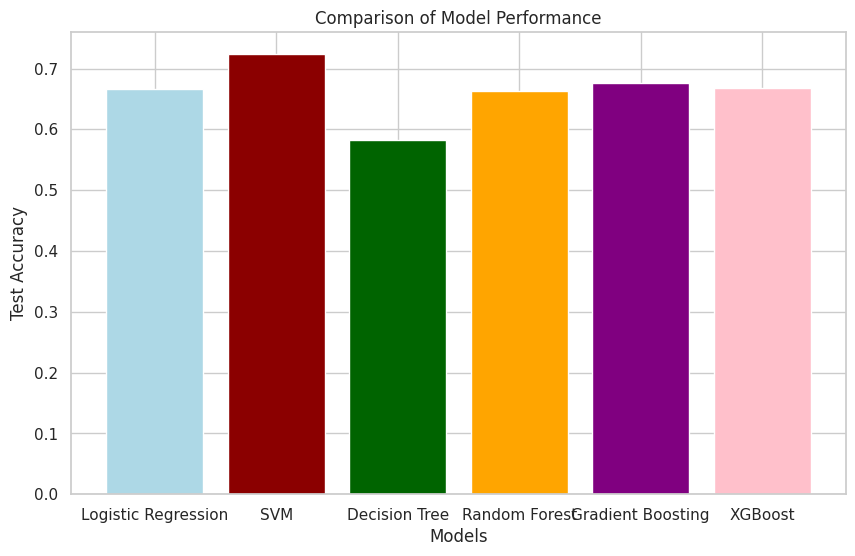

In [69]:
models = ['Logistic Regression','SVM','Decision Tree', 'Random Forest', 'Gradient Boosting', 'XGBoost']
accuracies = [acc_test_lr ,acc_test_svm, acc_test_dt, acc_test_rf, acc_test_gb, acc_test_xg]

colors = ['lightblue', 'darkred', 'darkgreen', 'orange', 'purple','pink', 'cyan']

plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color = colors)
plt.xlabel('Models')
plt.ylabel('Test Accuracy')
plt.title('Comparison of Model Performance')
plt.show()

# ROC Curve

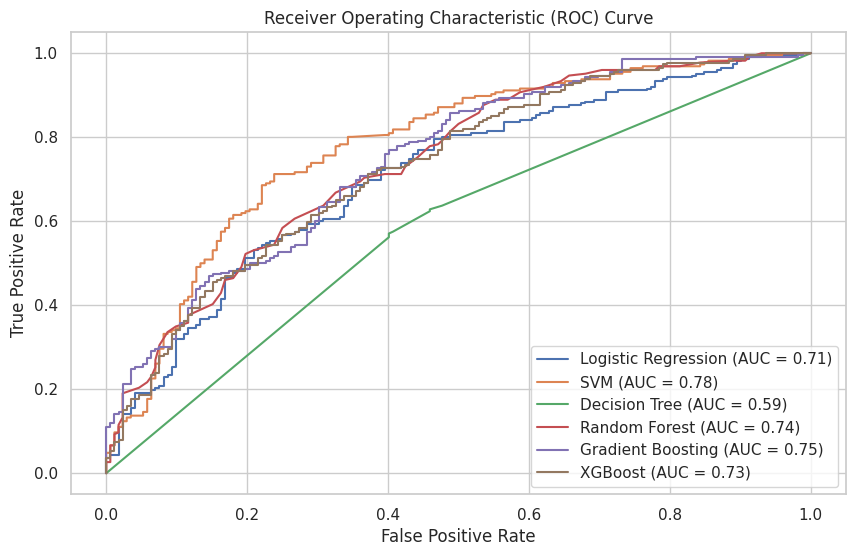

In [71]:
models = [
    ('Logistic Regression', lr_model.predict_proba(X_test)[:, 1]),
    ('SVM',  svm_model.predict_proba(X_test)[:, 1]),
    ('Decision Tree', dt_model.predict_proba(X_test)[:, 1]),
    ('Random Forest', rf_model.predict_proba(X_test)[:, 1]),
    ('Gradient Boosting', gb_model.predict_proba(X_test)[:, 1]),
    ('XGBoost', xg_model.predict_proba(X_test)[:, 1])
 ]

plt.figure(figsize=(10, 6))

for model_name, y_pred_proba in models:
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Problem Description: Small Dataset Challenges

### Issue:
- The dataset is small relative to its high dimensionality, leading to limited model performance.
- Insufficient samples make it difficult for complex models to generalize effectively.

## Approaches to Optimize Accuracy Based on Results and Dataset

### Feature Engineering:
- **Feature Selection**: Identify and retain the most important features using methods like Recursive Feature Elimination (RFE) or tree-based feature importance.
- **Dimensionality Reduction**: Apply PCA or LDA to reduce dimensionality and remove noisy or redundant features.

### Algorithm Choice and Ensemble Methods:
- Combine models using **stacking**, **blending**, or **voting classifiers** to leverage the strengths of multiple algorithms.
- Experiment with advanced models like **LightGBM** or **CatBoost** for gradient boosting.
